### 2- PCA and t-SNE visualization after  removal of substrate effect
###  Edgar Acuna
#### June 2021

In [53]:
import numpy as np
import pandas as pd
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
%matplotlib inline

### Loading the data

In [54]:
df1=pd.read_csv("c://onr2020/NRLset1_part1.csv",header=None)
df2=pd.read_csv("c://onr2020/NRLset1_part2.csv",header=None)
df3=pd.read_csv("c://onr2020/NRLset1_part3.csv",header=None)
df4=pd.read_csv("c://onr2020/NRLset1_part4.csv",header=None)
df5=pd.read_csv("c://onr2020/NRLset1_part5.csv",header=None)
df6=pd.read_csv("c://onr2020/NRLset1_part6.csv",header=None)
df7=pd.read_csv("c://onr2020/NRLset1_part7.csv",header=None)
df8=pd.read_csv("c://onr2020/NRLset1_part8.csv",header=None)
y=pd.read_csv("c://onr2020/labels.csv",header=None)
ys=pd.read_csv("c://onr2020/substrateIDs.csv",header=None)
subs=pd.read_csv("c://onr2020/substrates.csv",header=None)
mass=pd.read_csv("c://onr2020/massLoadings.csv",header=None)
dfset1=pd.concat([df1,df2,df3,df4,df5,df6,df7,df8],ignore_index=True)
print('Size of the dataframe: {}'.format(dfset1.shape))

Size of the dataframe: (18000, 1701)


In [55]:
print('Size of the dataframe: {}'.format(subs.shape))

Size of the dataframe: (9, 1701)


In [56]:
dfset2=dfset1.copy()
dfset2['Analyte']=y
dfset2['substrate']=ys
dfset2['MassLoadings']=mass

### Statistical measures and Histograms  of Mass Loadings for each Analyte

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x000002E3D16036C8>,
      dtype=object)

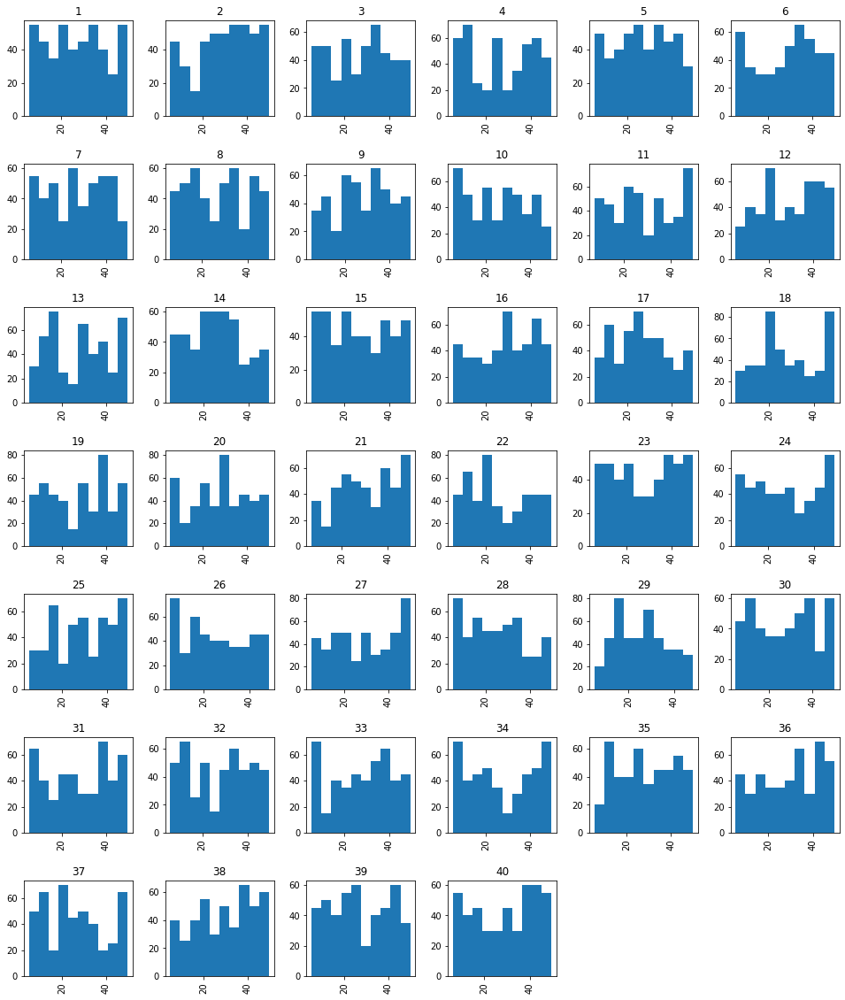

In [57]:
dfset2.MassLoadings.hist(by=dfset2.Analyte,figsize=(16,20))

In [58]:
dfset2.groupby(["Analyte"])["MassLoadings"].describe()

,count,mean,std,min,25%,50%,75%,max
Analyte,,,,,,,,
1,450.0,27.046643,12.955585,5.2343,15.651,26.4995,37.740,49.884
2,450.0,30.195687,12.459824,5.4163,21.426,30.8370,40.654,49.994
3,450.0,27.241640,12.835507,5.3820,17.278,28.6900,39.455,49.209
4,450.0,27.079658,13.863074,5.4502,12.038,25.9815,40.087,49.378
5,450.0,27.272244,12.676028,5.0334,16.944,27.1270,38.704,49.864
6,450.0,28.554343,12.947485,5.5243,16.801,30.7585,39.243,49.857
7,450.0,27.201333,12.811317,5.6028,16.107,27.3110,38.961,49.734
8,450.0,27.215544,12.825592,5.8781,15.855,28.3175,37.465,49.556
9,450.0,28.326056,12.110084,5.0193,20.143,30.3160,38.289,49.448


#### There is not much difference between the distribution of the analytes

### Removing the substrate effect

In [59]:
dfsub1=dfset2[dfset2['substrate']==1]
dfsub2=dfset2[dfset2['substrate']==2]
dfsub3=dfset2[dfset2['substrate']==3]
dfsub4=dfset2[dfset2['substrate']==4]
dfsub5=dfset2[dfset2['substrate']==5]
dfsub6=dfset2[dfset2['substrate']==6]
dfsub7=dfset2[dfset2['substrate']==7]
dfsub8=dfset2[dfset2['substrate']==8]
dfsub9=dfset2[dfset2['substrate']==9]

In [60]:
dfsub1.head(7)

,0,1,2,3,4,5,6,7,8,9,...,1694,1695,1696,1697,1698,1699,1700,Analyte,substrate,MassLoadings
4,0.022387,0.022508,0.022091,0.023054,0.023010,0.022740,0.023889,0.023936,0.023464,0.024810,...,0.022298,0.023536,0.025714,0.025306,0.025062,0.023609,0.023901,30,1,32.488
5,0.016367,0.025500,0.021789,0.021186,0.020799,0.020291,0.023251,0.023590,0.021309,0.024121,...,0.027326,0.025163,0.025810,0.028483,0.028229,0.023216,0.027765,20,1,23.202
8,0.014513,0.033718,0.030902,0.021875,0.020050,0.022401,0.000959,0.020182,0.019640,0.020317,...,0.016092,0.032118,0.027212,0.022861,0.040566,0.038721,0.029875,39,1,22.911
28,0.019014,0.018980,0.018913,0.018834,0.018755,0.018687,0.018640,0.018611,0.018572,0.018512,...,0.019040,0.019012,0.018988,0.018965,0.018946,0.018929,0.018900,6,1,15.496
46,0.017785,0.018747,0.019661,0.020427,0.019892,0.020054,0.018121,0.018920,0.019429,0.019454,...,0.019550,0.020251,0.019480,0.020524,0.019137,0.019782,0.019164,6,1,17.729
48,0.027184,0.025470,0.026716,0.027086,0.026306,0.025131,0.026762,0.025484,0.025934,0.024327,...,0.036369,0.037329,0.036102,0.037689,0.038054,0.035845,0.037684,18,1,49.083
60,0.015446,0.015041,0.014750,0.014772,0.015061,0.015508,0.016447,0.017075,0.017380,0.017459,...,0.019318,0.019324,0.019300,0.019267,0.019222,0.019299,0.020895,26,1,15.764


### 1- CENTERING

In [61]:
mdfsub1=dfsub1.iloc[:,0:1701]
mdfsub2=dfsub2.iloc[:,0:1701]
mdfsub3=dfsub3.iloc[:,0:1701]
mdfsub4=dfsub4.iloc[:,0:1701]
mdfsub5=dfsub5.iloc[:,0:1701]
mdfsub6=dfsub6.iloc[:,0:1701]
mdfsub7=dfsub7.iloc[:,0:1701]
mdfsub8=dfsub8.iloc[:,0:1701]
mdfsub9=dfsub9.iloc[:,0:1701]

In [62]:
y1=subs.loc[0,:]
y2=subs.loc[1,:]
y3=subs.loc[2,:]
y4=subs.loc[3,:]
y5=subs.loc[4,:]
y6=subs.loc[5,:]
y7=subs.loc[6,:]
y8=subs.loc[7,:]
y9=subs.loc[8,:]

In [63]:
modsub1=mdfsub1.apply(lambda x : x -(np.sum(np.array(x)*np.array(y1))/np.sum(np.array(y1)*np.array(y1)))*y1,axis=1)
modsub2=mdfsub2.apply(lambda x : x -(np.sum(np.array(x)*np.array(y2))/np.sum(np.array(y2)*np.array(y2)))*y2,axis=1)
modsub3=mdfsub3.apply(lambda x : x -(np.sum(np.array(x)*np.array(y3))/np.sum(np.array(y3)*np.array(y3)))*y3,axis=1)
modsub4=mdfsub4.apply(lambda x : x -(np.sum(np.array(x)*np.array(y4))/np.sum(np.array(y4)*np.array(y4)))*y4,axis=1)
modsub5=mdfsub5.apply(lambda x : x -(np.sum(np.array(x)*np.array(y5))/np.sum(np.array(y5)*np.array(y5)))*y5,axis=1)
modsub6=mdfsub6.apply(lambda x : x -(np.sum(np.array(x)*np.array(y6))/np.sum(np.array(y6)*np.array(y6)))*y6,axis=1)
modsub7=mdfsub7.apply(lambda x : x -(np.sum(np.array(x)*np.array(y7))/np.sum(np.array(y7)*np.array(y7)))*y7,axis=1)
modsub8=mdfsub8.apply(lambda x : x -(np.sum(np.array(x)*np.array(y8))/np.sum(np.array(y8)*np.array(y8)))*y8,axis=1)
modsub9=mdfsub9.apply(lambda x : x -(np.sum(np.array(x)*np.array(y9))/np.sum(np.array(y9)*np.array(y9)))*y9,axis=1)

In [64]:
subdf=[modsub1,modsub2,modsub3,modsub4,modsub5,modsub6,modsub7,modsub8,modsub9]
cent_subs=pd.concat(subdf)
cent_subs.head()

,0,1,2,3,4,5,6,7,8,9,...,1691,1692,1693,1694,1695,1696,1697,1698,1699,1700
4,0.002296,0.002603,0.002368,0.003507,0.003637,0.003537,0.004850,0.005059,0.004744,0.006244,...,-0.001858,-0.002531,-0.002143,-0.004422,-0.003123,-0.000884,-0.001225,-0.001406,-0.002792,-0.002432
5,-0.005471,0.003865,0.000351,-0.000060,-0.000258,-0.000582,0.002557,0.003072,0.000961,0.003941,...,-0.004245,-0.001915,-0.005149,-0.001717,-0.003814,-0.003100,-0.000355,-0.000540,-0.005481,-0.000857
8,-0.002496,0.016867,0.014204,0.005327,0.003649,0.006143,-0.015160,0.004201,0.003791,0.004599,...,0.002574,-0.018040,-0.018488,-0.006529,0.009548,0.004694,0.000399,0.018158,0.016369,0.007582
28,0.001313,0.001443,0.001536,0.001612,0.001687,0.001768,0.001866,0.001979,0.002079,0.002155,...,-0.004576,-0.004550,-0.004524,-0.004502,-0.004476,-0.004446,-0.004411,-0.004373,-0.004332,-0.004301
46,-0.001097,0.000040,0.001125,0.002056,0.001685,0.002006,0.000228,0.001179,0.001835,0.002005,...,-0.004655,-0.006438,-0.005102,-0.005563,-0.004804,-0.005517,-0.004411,-0.005738,-0.005031,-0.005584


In [65]:
from sklearn.decomposition import PCA
#Computing up to first 3 PC
pca = PCA(n_components=3)
#pca_result = pca.fit_transform(dfset1)
pca_result = pca.fit_transform(cent_subs.iloc[:,0:1701])
cent_subs['pca-one'] = pca_result[:,0]
cent_subs['pca-two'] = pca_result[:,1]
cent_subs['pca-three'] = pca_result[:,2]
#dfset1['pca-one'] = pca_result[:,0]
#dfset1['pca-two'] = pca_result[:,1] 
#dfset1['pca-three'] = pca_result[:,2]

print('Explained variation per principal component: {}'.format(pca.explained_variance_ratio_))
print('Cumulative explained variation by the 3PCs: {}'.format(pca.explained_variance_ratio_.cumsum()))

Explained variation per principal component: [0.57699223 0.24787576 0.06345991]
Cumulative explained variation by the 3PCs: [0.57699223 0.82486799 0.8883279 ]


In [66]:
cent_subs['substrate']=ys
cent_subs.head()

,0,1,2,3,4,5,6,7,8,9,...,1695,1696,1697,1698,1699,1700,pca-one,pca-two,pca-three,substrate
4,0.002296,0.002603,0.002368,0.003507,0.003637,0.003537,0.004850,0.005059,0.004744,0.006244,...,-0.003123,-0.000884,-0.001225,-0.001406,-0.002792,-0.002432,-0.540470,0.095924,-0.253682,1
5,-0.005471,0.003865,0.000351,-0.000060,-0.000258,-0.000582,0.002557,0.003072,0.000961,0.003941,...,-0.003814,-0.003100,-0.000355,-0.000540,-0.005481,-0.000857,-0.572104,0.142319,-0.213068,1
8,-0.002496,0.016867,0.014204,0.005327,0.003649,0.006143,-0.015160,0.004201,0.003791,0.004599,...,0.009548,0.004694,0.000399,0.018158,0.016369,0.007582,-0.608255,0.069766,-0.203429,1
28,0.001313,0.001443,0.001536,0.001612,0.001687,0.001768,0.001866,0.001979,0.002079,0.002155,...,-0.004476,-0.004446,-0.004411,-0.004373,-0.004332,-0.004301,-0.551442,0.088925,-0.279066,1
46,-0.001097,0.000040,0.001125,0.002056,0.001685,0.002006,0.000228,0.001179,0.001835,0.002005,...,-0.004804,-0.005517,-0.004411,-0.005738,-0.005031,-0.005584,-0.529053,0.101520,-0.306592,1


### PCA 2D Visualization afer centering

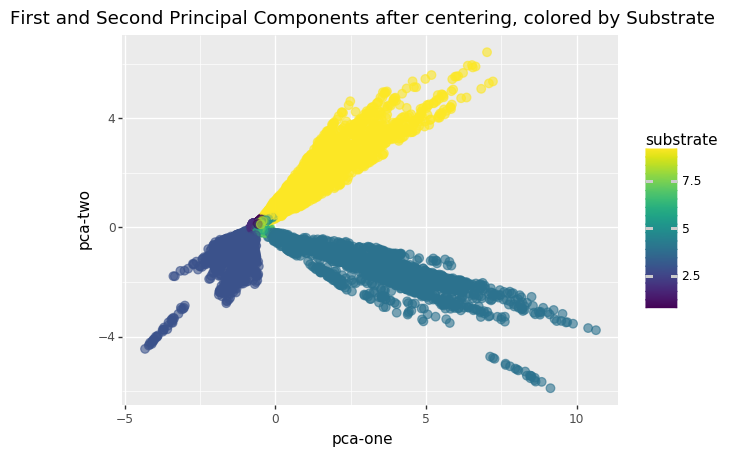

<ggplot: (-9223371838334683752)>

In [67]:
rndperm = np.random.permutation(dfset1.shape[0])
from plotnine import *
chart = ggplot(cent_subs.loc[rndperm[:18000],:], aes(x='pca-one', y='pca-two', color='substrate') ) \
        + geom_point(size=3,alpha=0.6) \
        + ggtitle("First and Second Principal Components after centering, colored by Substrate")
chart

###  t-SNE 2D visualization  after centering

In [68]:
import time

from sklearn.manifold import TSNE

n_sne = 10000
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=35, n_iter=300)
tsne_results = tsne.fit_transform(cent_subs.iloc[rndperm[:n_sne],0:1701])
print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

[t-SNE] Computing 106 nearest neighbors...
[t-SNE] Indexed 10000 samples in 4.285s...
[t-SNE] Computed neighbors for 10000 samples in 175.491s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 0.049491
[t-SNE] KL divergence after 250 iterations with early exaggeration: 71.760033
[t-SNE] KL divergence after 300 iterations: 2.380256
t-SNE done! Time elapse

In [69]:
df_tsne = cent_subs.iloc[rndperm[:n_sne],0:1706].copy()
print(df_tsne.shape)
print(tsne_results.shape)

(10000, 1705)
(10000, 2)


In [70]:
df_tsne['x-tsne'] = tsne_results[:,0]
df_tsne['y-tsne'] = tsne_results[:,1]
#df_tsne['z-tsne'] = tsne_results[:,2]

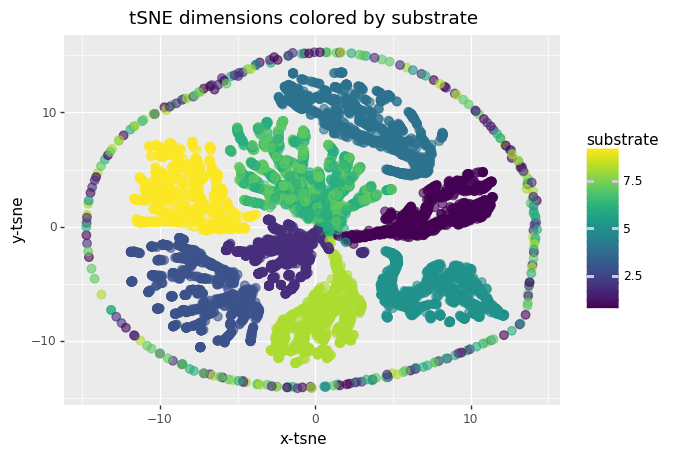

<ggplot: (-9223371838333095896)>

In [71]:
chart = ggplot( df_tsne, aes(x='x-tsne', y='y-tsne', color='substrate') ) \
        + geom_point(size=3,alpha=0.6) \
        + ggtitle("tSNE dimensions colored by substrate")
chart

### PCA 3D visualization after centering

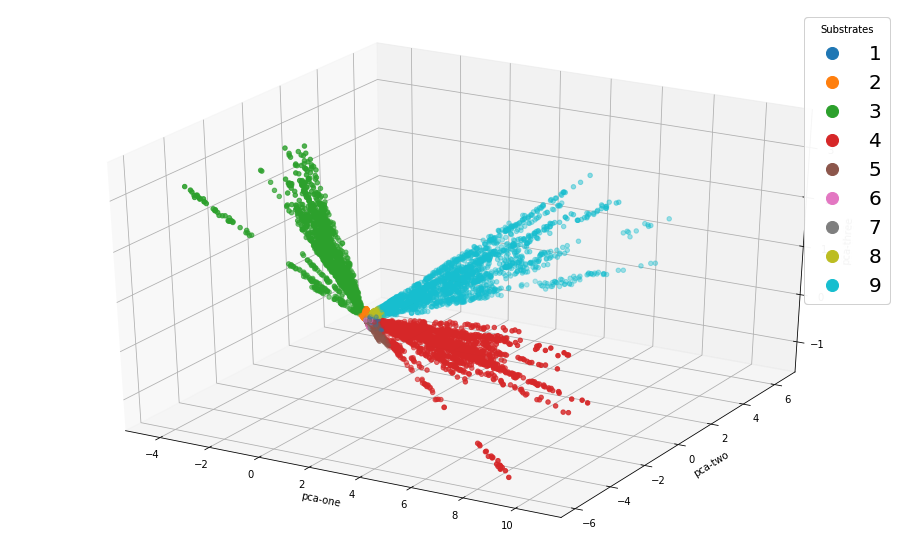

In [72]:
from mpl_toolkits.mplot3d import Axes3D
ax = plt.figure(figsize=(16,10)).gca(projection='3d')
scatter=ax.scatter(
    xs=cent_subs.loc[rndperm,:]["pca-one"], 
    ys=cent_subs.loc[rndperm,:]["pca-two"], 
    zs=cent_subs.loc[rndperm,:]["pca-three"], 
    c=cent_subs.loc[rndperm,:]["substrate"], 
    cmap='tab10'
)
ax.set_xlabel('pca-one')
ax.set_ylabel('pca-two')
ax.set_zlabel('pca-three')
legend1=ax.legend(*scatter.legend_elements(), loc="best", title="Substrates",markerscale=2,fontsize=20)
ax.add_artist(legend1)
plt.show()

In [73]:
import plotly.express as px
fig=px.scatter_3d(cent_subs, x="pca-one", y="pca-two", z="pca-three",color='substrate')
fig.show()

### t-SNE 3D visualization after centering

In [74]:
import time
from sklearn.manifold import TSNE
n_sne = 10000
time_start = time.time()
tsne = TSNE(n_components=3, verbose=1, perplexity=35, n_iter=300)
tsne_results = tsne.fit_transform(cent_subs.iloc[rndperm[:n_sne],0:1701])
print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

[t-SNE] Computing 106 nearest neighbors...
[t-SNE] Indexed 10000 samples in 4.646s...
[t-SNE] Computed neighbors for 10000 samples in 171.237s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 0.049491
[t-SNE] KL divergence after 250 iterations with early exaggeration: 71.739914
[t-SNE] KL divergence after 300 iterations: 2.098904
t-SNE done! Time elapse

In [80]:
#f_tsne = None
df_tsne1 = cent_subs.iloc[rndperm[:n_sne],:].copy()
df_tsne1['x-tsne'] = tsne_results[:,0]
df_tsne1['y-tsne'] = tsne_results[:,1]
df_tsne1['z-tsne'] = tsne_results[:,2]
df_tsne1.head()
df_tsne1.shape

(10000, 1708)

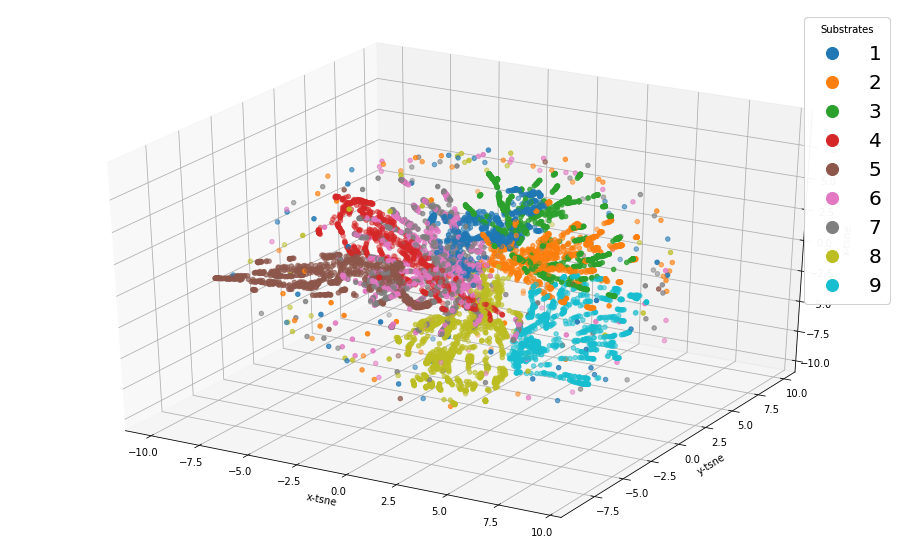

In [81]:
from mpl_toolkits.mplot3d import Axes3D
ax = plt.figure(figsize=(16,10)).gca(projection='3d')
scatter=ax.scatter(
    xs=df_tsne1["x-tsne"], 
    ys=df_tsne1['y-tsne'], 
    zs=df_tsne1["z-tsne"], 
    c=df_tsne1["substrate"], 
    cmap='tab10')
ax.set_xlabel('x-tsne')
ax.set_ylabel('y-tsne')
ax.set_zlabel('x-tsne')
legend1=ax.legend(*scatter.legend_elements(), loc="best", title="Substrates",markerscale=2,fontsize=20)
ax.add_artist(legend1)
plt.show()

In [83]:
import plotly.express as px
fig=px.scatter_3d(df_tsne1, x="x-tsne", y="y-tsne", z="z-tsne",color='substrate',width=1000, height=1000)
fig.show()

### CENTERING AND NORMALIZATION

In [84]:
# Using sklearn
from sklearn.preprocessing import normalize
b=cent_subs.iloc[:,0:1701]
b.head()

,0,1,2,3,4,5,6,7,8,9,...,1691,1692,1693,1694,1695,1696,1697,1698,1699,1700
4,0.002296,0.002603,0.002368,0.003507,0.003637,0.003537,0.004850,0.005059,0.004744,0.006244,...,-0.001858,-0.002531,-0.002143,-0.004422,-0.003123,-0.000884,-0.001225,-0.001406,-0.002792,-0.002432
5,-0.005471,0.003865,0.000351,-0.000060,-0.000258,-0.000582,0.002557,0.003072,0.000961,0.003941,...,-0.004245,-0.001915,-0.005149,-0.001717,-0.003814,-0.003100,-0.000355,-0.000540,-0.005481,-0.000857
8,-0.002496,0.016867,0.014204,0.005327,0.003649,0.006143,-0.015160,0.004201,0.003791,0.004599,...,0.002574,-0.018040,-0.018488,-0.006529,0.009548,0.004694,0.000399,0.018158,0.016369,0.007582
28,0.001313,0.001443,0.001536,0.001612,0.001687,0.001768,0.001866,0.001979,0.002079,0.002155,...,-0.004576,-0.004550,-0.004524,-0.004502,-0.004476,-0.004446,-0.004411,-0.004373,-0.004332,-0.004301
46,-0.001097,0.000040,0.001125,0.002056,0.001685,0.002006,0.000228,0.001179,0.001835,0.002005,...,-0.004655,-0.006438,-0.005102,-0.005563,-0.004804,-0.005517,-0.004411,-0.005738,-0.005031,-0.005584


In [85]:
#normalize(b)
b1=b.apply(lambda x: x/(x**2).sum()**.5, axis=1)
b1.head()

,0,1,2,3,4,5,6,7,8,9,...,1691,1692,1693,1694,1695,1696,1697,1698,1699,1700
4,0.006593,0.007476,0.006800,0.010072,0.010446,0.010157,0.013928,0.014528,0.013623,0.017932,...,-0.005337,-0.007268,-0.006155,-0.012700,-0.008968,-0.002538,-0.003519,-0.004037,-0.008019,-0.006984
5,-0.016333,0.011538,0.001048,-0.000179,-0.000770,-0.001737,0.007633,0.009170,0.002870,0.011766,...,-0.012672,-0.005718,-0.015373,-0.005127,-0.011386,-0.009255,-0.001060,-0.001612,-0.016363,-0.002559
8,-0.005348,0.036134,0.030431,0.011412,0.007818,0.013162,-0.032478,0.008999,0.008123,0.009853,...,0.005515,-0.038647,-0.039608,-0.013988,0.020456,0.010057,0.000856,0.038902,0.035069,0.016243
28,0.004714,0.005182,0.005515,0.005790,0.006058,0.006349,0.006700,0.007108,0.007465,0.007738,...,-0.016436,-0.016340,-0.016247,-0.016168,-0.016075,-0.015967,-0.015840,-0.015707,-0.015558,-0.015445
46,-0.003245,0.000118,0.003326,0.006083,0.004984,0.005934,0.000673,0.003487,0.005428,0.005932,...,-0.013769,-0.019043,-0.015090,-0.016453,-0.014209,-0.016319,-0.013047,-0.016972,-0.014881,-0.016518


### PCA 2D visualization after  centering and normalization

In [86]:
from sklearn.decomposition import PCA
#Computing up to first 3 PC
pca = PCA(n_components=3)
#pca_result = pca.fit_transform(dfset1)
pca_result = pca.fit_transform(b1.iloc[:,0:1701])
b1['pca-one'] = pca_result[:,0]
b1['pca-two'] = pca_result[:,1]
b1['pca-three'] = pca_result[:,2]
#dfset1['pca-one'] = pca_result[:,0]
#dfset1['pca-two'] = pca_result[:,1] 
#dfset1['pca-three'] = pca_result[:,2]
print('Explained variation per principal component: {}'.format(pca.explained_variance_ratio_))
print('Cumulative explained variation by the 3PCs: {}'.format(pca.explained_variance_ratio_.cumsum()))

Explained variation per principal component: [0.23746738 0.17600502 0.10165282]
Cumulative explained variation by the 3PCs: [0.23746738 0.4134724  0.51512522]


In [87]:
b1['substrate']=ys
b1.head()

,0,1,2,3,4,5,6,7,8,9,...,1695,1696,1697,1698,1699,1700,pca-one,pca-two,pca-three,substrate
4,0.006593,0.007476,0.006800,0.010072,0.010446,0.010157,0.013928,0.014528,0.013623,0.017932,...,-0.008968,-0.002538,-0.003519,-0.004037,-0.008019,-0.006984,-0.256809,-0.407042,0.239761,1
5,-0.016333,0.011538,0.001048,-0.000179,-0.000770,-0.001737,0.007633,0.009170,0.002870,0.011766,...,-0.011386,-0.009255,-0.001060,-0.001612,-0.016363,-0.002559,-0.189248,-0.544972,0.143245,1
8,-0.005348,0.036134,0.030431,0.011412,0.007818,0.013162,-0.032478,0.008999,0.008123,0.009853,...,0.020456,0.010057,0.000856,0.038902,0.035069,0.016243,0.086204,-0.214948,0.142834,1
28,0.004714,0.005182,0.005515,0.005790,0.006058,0.006349,0.006700,0.007108,0.007465,0.007738,...,-0.016075,-0.015967,-0.015840,-0.015707,-0.015558,-0.015445,-0.387727,-0.410613,0.253961,1
46,-0.003245,0.000118,0.003326,0.006083,0.004984,0.005934,0.000673,0.003487,0.005428,0.005932,...,-0.014209,-0.016319,-0.013047,-0.016972,-0.014881,-0.016518,-0.371047,-0.390030,0.289556,1


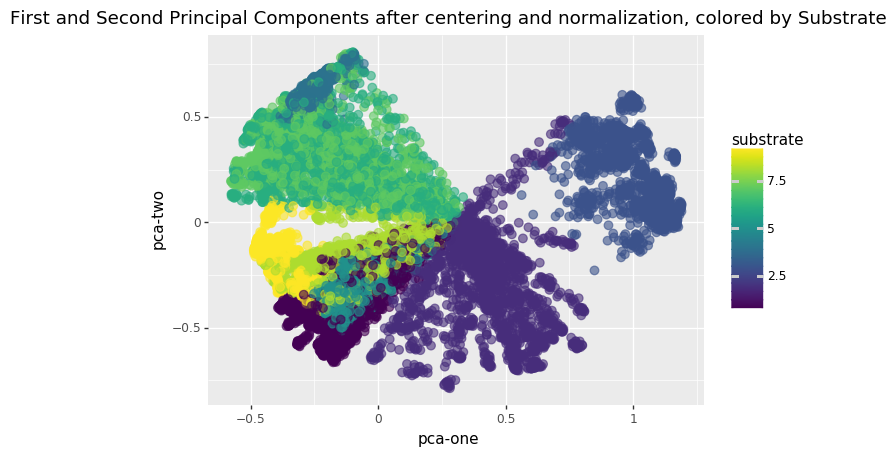

<ggplot: (-9223371838333041232)>

In [88]:
rndperm = np.random.permutation(dfset1.shape[0])
from plotnine import *
chart = ggplot(b1.loc[rndperm[:18000],:], aes(x='pca-one', y='pca-two', color='substrate') ) \
        + geom_point(size=3,alpha=0.6) \
        + ggtitle("First and Second Principal Components after centering and normalization, colored by Substrate")
chart

###  PCA 3D visualization after  centering and normalization

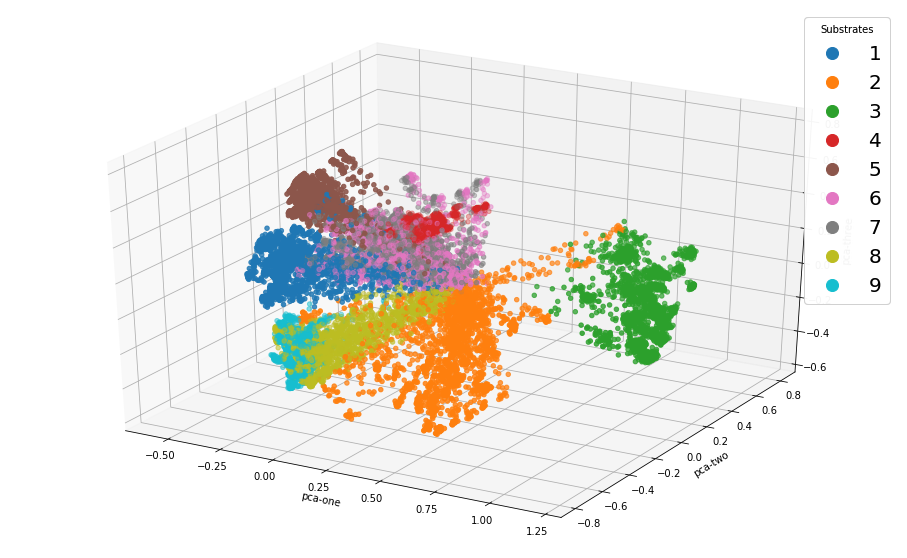

In [89]:
import warnings
warnings.filterwarnings('ignore')
import matplotlib.pyplot as plt
%matplotlib inline
from mpl_toolkits.mplot3d import Axes3D
ax = plt.figure(figsize=(16,10)).gca(projection='3d')
scatter=ax.scatter(
    xs=b1.loc[rndperm,:]["pca-one"], 
    ys=b1.loc[rndperm,:]["pca-two"], 
    zs=b1.loc[rndperm,:]["pca-three"], 
    c=b1.loc[rndperm,:]["substrate"], 
    cmap='tab10'
)
ax.set_xlabel('pca-one')
ax.set_ylabel('pca-two')
ax.set_zlabel('pca-three')
legend1=ax.legend(*scatter.legend_elements(), loc="best", title="Substrates",markerscale=2,fontsize=20)
ax.add_artist(legend1)
plt.show()

In [90]:
import plotly.express as px
fig=px.scatter_3d(b1, x="pca-one", y="pca-two", z="pca-three",color='substrate')
fig.show()

### t-SNE 2D visualization after  centering and normalization

In [91]:
import time

from sklearn.manifold import TSNE

n_sne = 10000
time_start = time.time()
tsne = TSNE(n_components=2, verbose=1, perplexity=50, n_iter=300)
tsne_results = tsne.fit_transform(b1.iloc[rndperm[:n_sne],0:1701])
print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 10000 samples in 3.907s...
[t-SNE] Computed neighbors for 10000 samples in 240.127s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 0.167958
[t-SNE] KL divergence after 250 iterations with early exaggeration: 68.979416
[t-SNE] KL divergence after 300 iterations: 2.155257
t-SNE done! Time elapse

In [92]:
b_tsne = b1.iloc[rndperm[:n_sne],0:1706].copy()
b_tsne.head()

,0,1,2,3,4,5,6,7,8,9,...,1695,1696,1697,1698,1699,1700,pca-one,pca-two,pca-three,substrate
7860,0.066362,0.065890,0.065240,0.063980,0.061739,0.057640,0.053542,0.051171,0.051574,0.054091,...,-0.027270,-0.027465,-0.027931,-0.028055,-0.027791,-0.027498,-0.253247,0.674180,0.045483,4
7692,0.012037,0.020724,0.010781,0.012528,0.008659,0.009012,0.013975,0.019999,0.023767,0.025737,...,-0.004261,0.000251,-0.011061,-0.003732,-0.010828,-0.006491,-0.182021,-0.304224,0.632800,5
8259,0.026257,0.003022,0.016954,0.072344,0.031958,-0.023267,-0.010818,0.009688,0.002969,0.043338,...,-0.033970,-0.006282,0.002763,-0.015818,0.007879,-0.045129,0.078184,0.099140,0.043042,6
4454,0.029539,0.027722,0.026651,0.026014,0.030473,0.038318,0.038888,0.047172,0.051122,0.054065,...,-0.025543,-0.029555,-0.030219,-0.026214,-0.026864,-0.018044,-0.216722,0.692950,-0.025545,4
15929,-0.017327,-0.015154,-0.009828,-0.014275,-0.014552,-0.019297,-0.011152,-0.015933,-0.017940,-0.019006,...,0.052222,0.044264,0.045009,0.043341,0.047616,0.041681,1.176122,0.073754,0.001379,3


In [93]:
#df_tsne = b1.iloc[rndperm[:n_sne],0:1706].copy()
#df_tsne.head()
b_tsne['x-tsne'] = tsne_results[:,0]
b_tsne['y-tsne'] = tsne_results[:,1]
b_tsne['substrate']=ys
b_tsne.head()

,0,1,2,3,4,5,6,7,8,9,...,1697,1698,1699,1700,pca-one,pca-two,pca-three,substrate,x-tsne,y-tsne
7860,0.066362,0.065890,0.065240,0.063980,0.061739,0.057640,0.053542,0.051171,0.051574,0.054091,...,-0.027931,-0.028055,-0.027791,-0.027498,-0.253247,0.674180,0.045483,4,-6.906952,-5.964649
7692,0.012037,0.020724,0.010781,0.012528,0.008659,0.009012,0.013975,0.019999,0.023767,0.025737,...,-0.011061,-0.003732,-0.010828,-0.006491,-0.182021,-0.304224,0.632800,5,-1.146537,-4.029955
8259,0.026257,0.003022,0.016954,0.072344,0.031958,-0.023267,-0.010818,0.009688,0.002969,0.043338,...,0.002763,-0.015818,0.007879,-0.045129,0.078184,0.099140,0.043042,6,-0.587974,3.181603
4454,0.029539,0.027722,0.026651,0.026014,0.030473,0.038318,0.038888,0.047172,0.051122,0.054065,...,-0.030219,-0.026214,-0.026864,-0.018044,-0.216722,0.692950,-0.025545,4,-5.997650,-3.934978
15929,-0.017327,-0.015154,-0.009828,-0.014275,-0.014552,-0.019297,-0.011152,-0.015933,-0.017940,-0.019006,...,0.045009,0.043341,0.047616,0.041681,1.176122,0.073754,0.001379,3,9.591178,0.102649


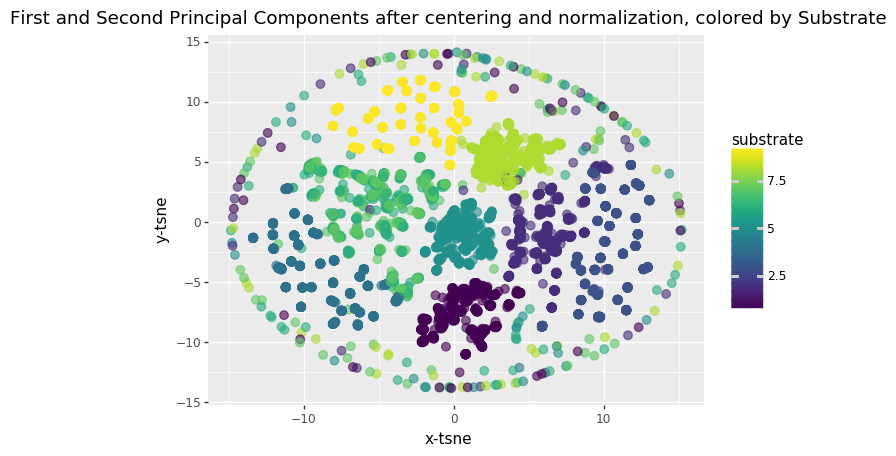

<ggplot: (-9223371838334729008)>

In [94]:
#b1['x-tsne'] = tsne_results[:,0]
#b1['y-tsne'] = tsne_results[:,1]
#df_tsne['z-tsne'] = tsne_results[:,2]
#df_tsne.head()
chart = ggplot(b_tsne, aes(x='x-tsne', y='y-tsne', color='substrate') ) \
        + geom_point(size=3,alpha=0.6) \
        + ggtitle("First and Second Principal Components after centering and normalization, colored by Substrate")
chart

 ### t-SNE 2D visualization after  centering and normalization  using 100 PCs

In [95]:
pca_100 = PCA(n_components=100)
pca_result_100 = pca_100.fit_transform(b1.iloc[:,0:1701])
print('Cumulative explained variation for 100 principal components: {}'.format(np.sum(pca_100.explained_variance_ratio_)))

Cumulative explained variation for 100 principal components: 0.7480653766699599


In [96]:
n_sne = 10000

time_start = time.time()

tsne = TSNE(n_components=2,verbose=1, perplexity=50, n_iter=300)
tsne_pca_results = tsne.fit_transform(pca_result_100[rndperm[:n_sne]])

print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.219s...
[t-SNE] Computed neighbors for 10000 samples in 4.834s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 0.150498
[t-SNE] KL divergence after 250 iterations with early exaggeration: 66.412025
[t-SNE] KL divergence after 300 iterations: 1.922576
t-SNE done! Time elapsed:

In [97]:
df_tsne3= b1.iloc[rndperm[:n_sne],:].copy()
#df_tsne.head()

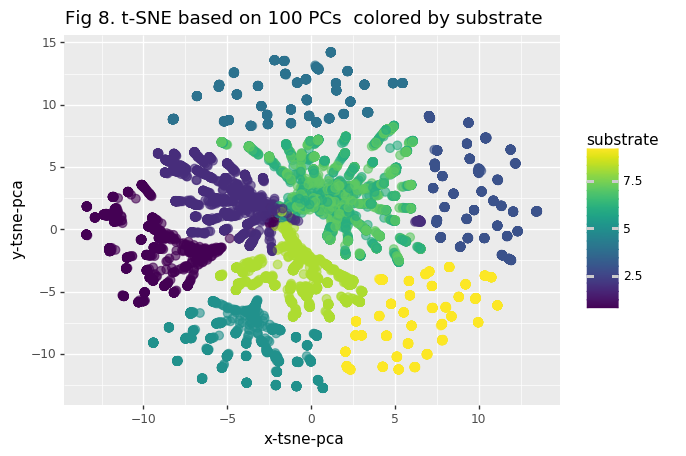

<ggplot: (-9223371838329804528)>

In [98]:
df_tsne3['x-tsne-pca'] = tsne_pca_results[:,0]
df_tsne3['y-tsne-pca'] = tsne_pca_results[:,1]
chart = ggplot( df_tsne3, aes(x='x-tsne-pca', y='y-tsne-pca', color='substrate') ) \
        + geom_point(size=3,alpha=0.6) \
        + ggtitle("Fig 8. t-SNE based on 100 PCs  colored by substrate")
chart

 ### PCA 3D visualization after  centering and normalization

In [99]:
n_sne = 10000

time_start = time.time()

tsne = TSNE(n_components=3, verbose=1, perplexity=50, n_iter=400)
tsne_pca_results = tsne.fit_transform(pca_result_100[rndperm[:n_sne]])

print('t-SNE done! Time elapsed: {} seconds'.format(time.time()-time_start))

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 10000 samples in 0.207s...
[t-SNE] Computed neighbors for 10000 samples in 4.345s...
[t-SNE] Computed conditional probabilities for sample 1000 / 10000
[t-SNE] Computed conditional probabilities for sample 2000 / 10000
[t-SNE] Computed conditional probabilities for sample 3000 / 10000
[t-SNE] Computed conditional probabilities for sample 4000 / 10000
[t-SNE] Computed conditional probabilities for sample 5000 / 10000
[t-SNE] Computed conditional probabilities for sample 6000 / 10000
[t-SNE] Computed conditional probabilities for sample 7000 / 10000
[t-SNE] Computed conditional probabilities for sample 8000 / 10000
[t-SNE] Computed conditional probabilities for sample 9000 / 10000
[t-SNE] Computed conditional probabilities for sample 10000 / 10000
[t-SNE] Mean sigma: 0.150498
[t-SNE] KL divergence after 250 iterations with early exaggeration: 65.891479
[t-SNE] KL divergence after 400 iterations: 0.740173
t-SNE done! Time elapsed:

In [100]:
df_tsne4 = b1.iloc[rndperm[:n_sne],:].copy()
#df_tsne.head()

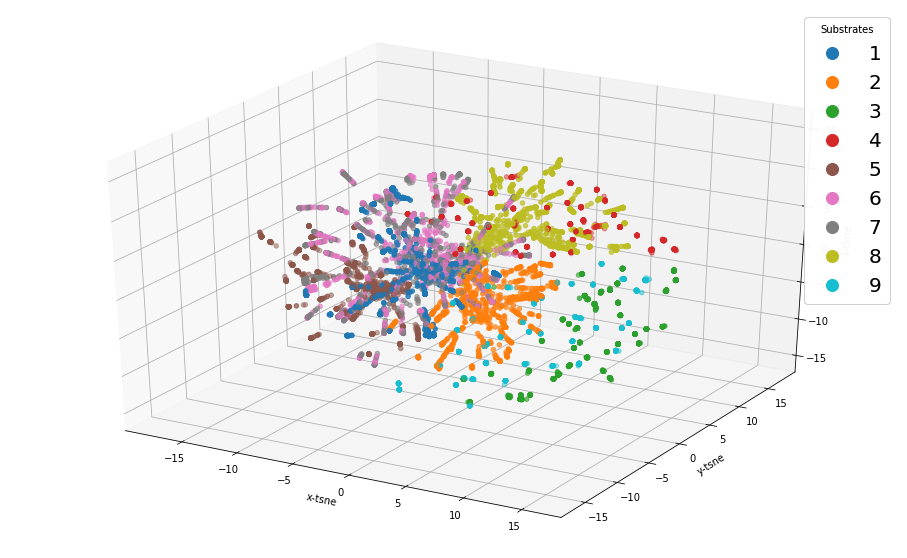

In [102]:
df_tsne4['x-tsne-pca'] = tsne_pca_results[:,0]
df_tsne4['y-tsne-pca'] = tsne_pca_results[:,1]
df_tsne4['z-tsne-pca'] = tsne_pca_results[:,2]
ax = plt.figure(figsize=(16,10)).gca(projection='3d')
ax.scatter(
    xs=df_tsne4["x-tsne-pca"], 
    ys=df_tsne4['y-tsne-pca'], 
    zs=df_tsne4["z-tsne-pca"], 
    c=df_tsne4["substrate"], 
    cmap='tab10'
)
ax.set_xlabel('x-tsne')
ax.set_ylabel('y-tsne')
ax.set_zlabel('x-tsne')
legend1=ax.legend(*scatter.legend_elements(), loc="best", title="Substrates",markerscale=2,fontsize=20)
ax.add_artist(legend1)
plt.show()